In [561]:
from __future__ import division
import numpy as np
from numpy import array
from numpy.random import sample as rs
from numpy import newaxis as na
import pandas as pd 
from scipy.stats import distributions
from scipy.stats import sem
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable

from radd.rl import multirace, analyzer, visr
from radd import theta

from scipy.stats import pearsonr
from IPython.display import display, Latex

temporal_dynamics = lambda p, t: np.cosh(p['xb'][:, na] * t)
updateQ = lambda q, winner, r, A: q[winner][-1] + A*(r - q[winner][-1])
boltzmann_choiceP = lambda q, name, B: np.exp(B*q[name][-1])/np.sum([np.exp(B*q[k][-1]) for k in q.keys()])

homedir = os.path.expanduser('~')
cards = pd.read_csv(os.path.join(homedir, "Dropbox/Projects/IGTob/IGTCards.csv"))
cards_scaled=cards.copy()*.01
cards_normed = (cards-cards.mean().mean())/cards.std().mean()

datadf = pd.read_csv(os.path.join(homedir, "Dropbox/Projects/IGTob/IGT_data.csv"))
dat = datadf.dropna()


In [562]:
pdict = theta.random_inits(['vd', 'vi', 'tr', 'a', 'xb'])
pdict

{'a': array([ 0.42105]),
 'tr': array([ 0.30434]),
 'vd': array([ 1.10371]),
 'vi': array([ 0.72593]),
 'xb': array([ 1.53692])}

In [30]:
def simulate_race(p, pc_map={'vd': ['vd_a', 'vd_b', 'vd_c', 'vd_d'], 'vi': ['vi_a', 'vi_b', 'vi_c', 'vi_d']}, dt=.001, si=.01, tb=2.5):

    nresp = len(pc_map.values()[0])
    p = vectorize_params(p, pc_map=pc_map, nresp=nresp)
    dx=np.sqrt(si*dt)

    Pe = 0.5*(1 + (p['vd']-p['vi'])*dx/si)
    #Pd = 0.5*(1 + p['vd']*dx/si)
    #Pi = 0.5*(1 + p['vi']*dx/si)

    Tex = np.ceil((tb-p['tr'])/dt).astype(int)
    xtb = temporal_dynamics(p, np.cumsum([dt]*Tex.max()))
    execution = xtb[0] * np.cumsum(np.where((rs((nresp, Tex.max())).T < Pe),dx,-dx).T, axis=1)
    #direct = np.where((rs((nresp, Tex.max())).T < Pd),dx,-dx).T
    #indirect = np.where((rs((nresp, Tex.max())).T < Pi),dx,-dx).T
    #execution = xtb[0] * np.cumsum(direct-indirect, axis=1)

    return execution


In [110]:
dt=.001; si=.1; tb=.8; ntot=1000
dx=np.sqrt(si*dt)
p={'vd':.8, 'vi':.3, 'a':.4, 'tr':.2, 'xb':1.5}

p['a']=.4
p['tr']=.2
p['xb']=1.5

In [5]:
#p={'vd':.7, 'vi':.4}; p['a']=.4; p['tr']=.2; p['xb']=1.5
pdict = theta.random_inits(['vd', 'vi', 'tr', 'a', 'xb'])
p = deepcopy(pdict)
output = multirace.run_trials(p, cards_scaled, nblocks=2, si=.01, a_go=.25, a_no=.25, beta=3)
choices, rts, all_traces, qdict, qdict_go, qdict_no, choice_prob, vdhist, vihist = output
Pi,Qi = analyzer.igt_scores(np.asarray(choices))

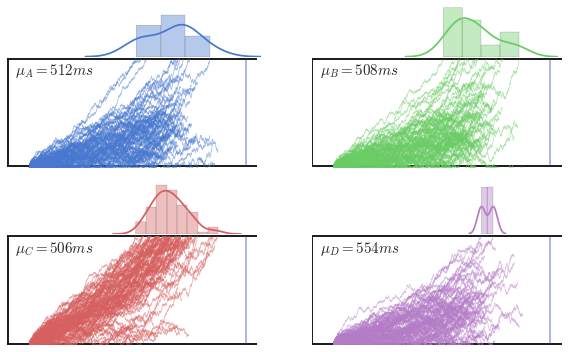

In [73]:
visr.plot_traces_rts(pdict, all_traces, rts)

In [579]:
alpha_hi_dist = distributions.uniform(.25, .10)
alpha_midhi_dist = distributions.uniform(.15, .10)
alpha_midlow_dist = distributions.uniform(.05, .10)
#alpha_midlow_dist = distributions.uniform(.05, .05)
alpha_low_dist = distributions.uniform(.005, .05)

alpha_dist = {'ahi':alpha_hi_dist, 'amidhi':alpha_midhi_dist, 'amidlow':alpha_midlow_dist, 'alow': alpha_low_dist}

In [580]:
alphas_go=hs([alpha_dist[k].rvs(50) for k in alpha_dist.keys()]) 
alphas_no=hs([alpha_dist[k].rvs(50) for k in alpha_dist.keys()]) 

np.random.shuffle(alphas_go)
np.random.shuffle(alphas_no)

betas = np.linspace(.05, 8, 30)

In [581]:
df = pd.DataFrame({'g':alphas_go, 'n':alphas_no, 'd': alphas_go-alphas_no}, index=np.arange(len(alphas_go)))
dfsorted = df.sort_values(by='d')

ago = dfsorted['g'].values
ano = dfsorted['n'].values

In [584]:
#plt.hist(ago-ano)
plt.plot(ago-ano)

In [ ]:
p={'vd':.7, 'vi':.4}; p['a']=.4; p['tr']=.2; p['xb']=1.5
trialsdf, igtdf = multirace.run_full_sims(p, env=cards_scaled.copy(), alphas_go=ago, alphas_no=ano, betas=betas, nagents=50)

In [343]:
tdf = trialsdf[trialsdf.bgroup.isin([trialsdf.bgroup.max()])]
pqdf = igtdf[igtdf.bgroup.isin([igtdf.bgroup.max()])]

In [351]:
pgroups = pqdf.groupby('agroup').mean()['P'].values.reshape((3,20))

In [512]:
trialsdf['adiff'] = trialsdf['a_go'] - trialsdf['a_no']
#tdf = trialsdf.groupby(['group', 'trial']).mean().reset_index()
trials_low = trialsdf[trialsdf['adiff']<=-.1]
trials_hi = trialsdf[trialsdf['adiff']>.1]
trials_med = trialsdf[(trialsdf['adiff']>-.1)&(trialsdf['adiff']<=.1)]
trials_list = [trials_low, trials_med, trials_hi]
adglist = ['low', 'med', 'hi']
for i, tdf in enumerate(trials_list):
    trials_list[i].loc[:, 'adg'] = adglist[i]
    
tdf_list = pd.concat([tdf.groupby(['group', 'trial']).mean().reset_index() for tdf in trials_list])


In [527]:
igtdf['adiff'] = igtdf['a_go'] - igtdf['a_no']


In [530]:
igtdf[igtdf.adiff.isin(vdhi.adiff)]

,agent,bgroup,agroup,group,a_go,a_no,beta,P,Q,adiff


In [547]:
igtdf[igtdf.adiff.isin(vdhi.adiff.unique())]

,agent,bgroup,agroup,group,a_go,a_no,beta,P,Q,adiff


In [549]:

igtdf.groupby('group').mean().adiff

group
0.0     -0.30086
1.0     -0.28616
2.0     -0.27986
3.0     -0.27870
4.0     -0.27508
5.0     -0.27312
6.0     -0.27177
7.0     -0.27156
8.0     -0.26795
9.0     -0.21893
10.0    -0.21228
11.0    -0.20528
12.0    -0.20401
13.0    -0.20313
14.0    -0.20028
          ...   
165.0    0.19335
166.0    0.19857
167.0    0.19974
168.0    0.20616
169.0    0.20939
170.0    0.21861
171.0    0.27935
172.0    0.28924
173.0    0.29160
174.0    0.29231
175.0    0.29475
176.0    0.29578
177.0    0.29682
178.0    0.30466
179.0    0.31052
Name: adiff, dtype: float64

In [536]:
dff.columns

Index([u'trial', u'agent', u'agroup', u'bgroup', u'group', u'qval', u'vd',
       u'vi', u'vdiff', u'v_opt_diff', u'v_imp_diff', u'rt', u'a_go', u'a_no',
       u'beta', u'adiff'],
      dtype='object')

In [546]:
vdhi.adiff

40     0.10325
41     0.10392
42     0.17908
43     0.18919
44     0.19105
45     0.19335
46     0.19857
47     0.19974
48     0.20616
49     0.20939
50     0.21861
51     0.27935
52     0.28924
53     0.29160
54     0.29231
        ...   
165    0.19335
166    0.19857
167    0.19974
168    0.20616
169    0.20939
170    0.21861
171    0.27935
172    0.28924
173    0.29160
174    0.29231
175    0.29475
176    0.29578
177    0.29682
178    0.30466
179    0.31052
Name: adiff, dtype: float64

In [543]:
df = pd.concat(trials_list)
dff = df.groupby('group').mean().reset_index()
vdhi = dff[dff.adiff>.1]
len(vdhi)

60

In [497]:

pd.concat(tdf_list)

,group,trial,agent,agroup,bgroup,qval,vd,vi,vdiff,v_opt_diff,v_imp_diff,rt,a_go,a_no,beta,adiff
0,0,1,24.5,0.0,0.0,0.00000,0.69995,0.40118,0.29877,-0.00039,0.00002,0.79850,0.01246,0.31332,2.0,-0.30086
1,0,2,24.5,0.0,0.0,0.00150,0.70027,0.39312,0.30715,-0.00090,0.00008,0.77420,0.01246,0.31332,2.0,-0.30086
2,0,3,24.5,0.0,0.0,0.00348,0.70044,0.38896,0.31148,0.00240,0.01150,0.76344,0.01246,0.31332,2.0,-0.30086
3,0,4,24.5,0.0,0.0,0.00249,0.70024,0.39400,0.30623,0.00191,0.01102,0.79036,0.01246,0.31332,2.0,-0.30086
4,0,5,24.5,0.0,0.0,0.00113,0.69972,0.40702,0.29270,0.02136,0.04511,0.76512,0.01246,0.31332,2.0,-0.30086
5,0,6,24.5,0.0,0.0,0.00262,0.69945,0.41393,0.28552,0.02071,0.04495,0.76412,0.01246,0.31332,2.0,-0.30086
6,0,7,24.5,0.0,0.0,-0.00475,0.69981,0.40490,0.29490,0.02975,0.06063,0.76750,0.01246,0.31332,2.0,-0.30086
7,0,8,24.5,0.0,0.0,0.00496,0.69934,0.41658,0.28276,0.02899,0.06097,0.78450,0.01246,0.31332,2.0,-0.30086
8,0,9,24.5,0.0,0.0,0.00203,0.69973,0.40667,0.29306,0.08484,0.03939,0.80460,0.01246,0.31332,2.0,-0.30086
9,0,10,24.5,0.0,0.0,-0.00695,0.70019,0.39529,0.30489,0.09419,0.04751,0.78006,0.01246,0.31332,2.0,-0.30086


In [491]:
trials_low.groupby()

,agent,trial,agroup,bgroup,group,qval,vd,vi,vdiff,v_opt_diff,v_imp_diff,choice,rt,a_go,a_no,beta,adiff,ad_group
0,0,1,0,0,0,0.00000,0.69783,0.45464,0.24319,0.00102,0.00102,d,0.866,0.01246,0.31332,2,-0.30086,x
1,0,2,0,0,0,0.00000,0.69702,0.47490,0.22212,-0.00102,-0.00102,a,0.916,0.01246,0.31332,2,-0.30086,x
2,0,3,0,0,0,0.00000,0.69692,0.47736,0.21956,-0.00304,0.00101,b,0.693,0.01246,0.31332,2,-0.30086,x
3,0,4,0,0,0,0.00623,0.69783,0.45464,0.24319,-0.00203,0.00200,d,0.786,0.01246,0.31332,2,-0.30086,x
4,0,5,0,0,0,0.00000,0.69702,0.47490,0.22212,0.08584,0.09097,a,0.722,0.01246,0.31332,2,-0.30086,x
5,0,6,0,0,0,0.00000,0.70823,0.19310,0.51513,0.08677,0.08934,c,0.654,0.01246,0.31332,2,-0.30086,x
6,0,7,0,0,0,0.00000,0.69692,0.47736,0.21956,0.08352,0.09121,b,0.781,0.01246,0.31332,2,-0.30086,x
7,0,8,0,0,0,0.00000,0.70823,0.19310,0.51513,0.08446,0.08960,c,0.776,0.01246,0.31332,2,-0.30086,x
8,0,9,0,0,0,0.00623,0.69783,0.45464,0.24319,0.08538,0.09051,d,0.833,0.01246,0.31332,2,-0.30086,x
9,0,10,0,0,0,0.00623,0.69783,0.45464,0.24319,0.00442,0.01127,d,0.701,0.01246,0.31332,2,-0.30086,x


In [486]:
trialsdf[(trialsdf['adiff']>-.1)&(trialsdf['adiff']<=.1)]

(330000, 17)

In [467]:
tdf = trialsdf.groupby(['group', 'trial']).mean().reset_index()
for bgroup, trials in tdf.groupby('bgroup'):
    scores = igtdf.groupby('group').mean()
    bgrp_scores = scores[scores.bgroup.isin([bgroup])]
    plot_reactivity_strategy(trials, bgrp_scores)

/home/kyle/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


IndexError: index 1 is out of bounds for axis 0 with size 1

In [465]:
def plot_reactivity_strategy(trialsdf, igtdf, cm='rainbow', cm2='Blues', save=False, pq='P'):

    if pq=='P':
        measure = 'Payoff ("P")'
    else:
        measure = 'Sensitivity ("Q")'
    trialsdf['adiff'] = trialsdf['a_go'] - trialsdf['a_no']
    n = trialsdf.agroup.unique().size
    betas = trialsdf.adiff.unique()
    sm, vmin, vmax = visr.gen_mappable(vals_to_map=betas, cm=cm)
    f, axes = plt.subplots(2,2, figsize=(14, 10))
    ax1, ax2, ax3, ax4 = axes.flatten()

    for grp, grpdf in trialsdf.groupby('agroup'):
        colr = sm.to_rgba(betas[int(grp)])
        ax1.plot(grpdf.vdiff.values, color=colr)
        ax2.plot(grpdf.v_opt_diff.values, color=colr)
        sns.despine()

    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cb = plt.colorbar(sm, cax)
    sm.colorbar.set_ticks([vmin, vmax])
    cax.set_yticklabels([vmin, vmax])
    
    pvals_by_group = igtdf.groupby('agroup').mean().loc[:, pq].values
    reactivity = np.array([grpdf.vdiff.mean() for grp, grpdf in trialsdf.groupby('agroup')])
    strategy = np.array([grpdf.v_opt_diff.mean() for grp, grpdf in trialsdf.groupby('agroup')])

    for i in range(n):
        colr = sm.to_rgba(betas[i])
        
        ax3.scatter(pvals_by_group[i], reactivity[i], color=colr, s=30)
        ax4.scatter(pvals_by_group[i], strategy[i], color=colr, s=30)

        #ax3.scatter(qvals_by_group[i], reactivity[i], color=colr2, s=30)
        #ax4.scatter(qvals_by_group[i], strategy[i], color=colr2, s=30)

    ax1.set_title('$\Delta_{card} = V_{D}(t)-V_{I}(t)$', fontsize=19)
    ax2.set_title('$\Delta_{OS} = (\Delta_C + \Delta_D) - (\Delta_A + \Delta_B)$', fontsize=19)
    ax1.set_ylabel('Selected Channel Strength ($\Delta_{card}$)', fontsize=17)
    ax2.set_ylabel('Optimal-Subopt Ch. Strength ($\Delta_{OS}$)', fontsize=17)
    ax3.set_ylabel('$\mu \Delta_{card}$', fontsize=22)
    ax4.set_ylabel('$\mu \Delta_{OS}$', fontsize=22)

    plt.tight_layout()
    for ax in [ax1, ax2]:
        ax.set_xlabel('Trials', fontsize=22)
    for ax in [ax3, ax4]:
        ax.set_xlabel(measure, fontsize=22)
    f.subplots_adjust(wspace=.4, hspace=.3)
    if save:
        f.savefig('.'.join(['reactivity_strategy_', measure, 'png']), dpi=400)

In [393]:
trialsdf.groupby('agroup').mean().size

#vdgroups = vd.reshape(3,20)


840

15000

In [420]:
tdf = trialsdf.groupby(['group', 'trial']).mean().reset_index()
vd = tdf.groupby(['bgroup', 'agroup']).mean().reset_index().vdiff.values
pv = igtdf.groupby(['bgroup', 'agroup']).mean().reset_index()['P'].values


In [441]:
pdf = igtdf.groupby('agroup').mean()
vdf = trialsdf.groupby(['bgroup', 'agroup']).mean()

In [459]:
np.random.choice(np.arange(4))

1

In [446]:

vdf.reset_index(inplace=True)
vdf[vdf.bgroup.isin([0])].vdiff

0     0.35687
1     0.36491
2     0.35507
3     0.35558
4     0.35659
5     0.35004
6     0.35171
7     0.35166
8     0.35429
9     0.35669
10    0.36769
11    0.36496
12    0.34877
13    0.34864
14    0.35507
       ...   
45    0.31239
46    0.31399
47    0.31033
48    0.31177
49    0.30999
50    0.31250
51    0.31095
52    0.31047
53    0.30928
54    0.31068
55    0.30993
56    0.31019
57    0.30909
58    0.31056
59    0.31122
Name: vdiff, dtype: float64

In [436]:
vvv = vdf.vdiff.values.reshape(3,60)
ppp = pdf.P.values.reshape(3,60)
for i in range(3):
    sns.regplot(vvv[i], ppp[i])

ValueError: total size of new array must be unchanged

In [428]:
trialsdf.groupby('group').mean().shape

(180, 14)

In [380]:

pgroups = [pqdf['P'].values for pq, pqdf in igtdf.groupby('agroup')]
vdgroups = [tdf['vdiff'].values for td, tdf in trialsdf.groupby('agroup')]

for i in range(3):
    sns.regplot(pgroups[i], vdgroups[i])

ValueError: all the input array dimensions except for the concatenation axis must match exactly

In [378]:
[np.mean(vdg) for vdg in pgroups]

[16.417999999999999, 19.234666666666662, 21.342666666666666]

In [377]:
[np.mean(vdg) for vdg in vdgroups]

[0.32324304739741183, 0.34814455815726508, 0.374087262846311]

In [365]:
for i in range()

[array([ 41.32,  48.16,  43.96,  45.64,  42.  ,  42.16,  39.92,  46.28,
         43.24,  50.08,  52.6 ,  55.12,  46.72,  46.04,  51.12,  49.04,
         51.88,  48.56,  14.08,  13.92,   9.92,  13.8 ,  13.8 ,  14.16,
          1.68,  59.04,   1.44,  59.84,  -0.68,  17.04,   0.2 ,  15.36,
         15.8 ,  -2.44,  14.44,  13.36,   0.72,  -5.28,  -3.76,  -6.52,
         -3.04,  -6.52,  11.24,  13.2 ,  10.72,   8.52,  12.12,  11.2 ,
          9.76,  10.6 ,   6.36, -19.96, -25.16, -19.2 , -21.04, -24.92,
        -23.32, -19.84, -23.  , -26.4 ]),
 array([ 47.6 ,  52.52,  48.76,  52.44,  47.4 ,  49.84,  45.88,  51.72,
         53.16,  62.4 ,  60.8 ,  62.48,  58.32,  59.4 ,  60.92,  59.84,
         64.16,  59.32,  14.12,  16.48,  14.32,  19.2 ,  14.84,  18.6 ,
          3.24,  74.16,   1.36,  74.2 ,  -0.64,  22.44,   0.2 ,  27.88,
         22.84,  -0.4 ,  20.52,  20.44,  -1.8 ,  -9.36,  -7.88, -10.16,
         -9.28,  -8.84,  25.32,  25.12,  26.04,  22.12,  26.2 ,  19.68,
         21.16,  19.84

In [ ]:
np.sort(len(tdf)/3*[1,2,3])

In [334]:
sns.set(style='darkgrid')
mudf = trialsdf.groupby('agroup').mean().reset_index()
rho, pval = pearsonr(mudf.agroup.values, mudf.vdiff.values)
sns.regplot('agroup', 'vdiff', mudf, color='k', label='r={0}, p={1}'.format(rho, pval), )
plt.legend(loc=0)
sns.despine()


In [123]:
payoff = igtdf.groupby(['agroup']).mean().reset_index()

In [130]:
payoff = igtdf[igtdf.agroup==ag].P.values

In [220]:
trialsdf['adiff'] = trialsdf['a_go'] - trialsdf['a_no']

In [338]:
mudf = trialsdf.groupby(['group', 'trial']).mean().reset_index()
#trialsdf['adiff'] = trialsdf['a_go'] - trialsdf['a_no']


In [339]:
mudf

,group,trial,agent,agroup,bgroup,qval,vd,vi,vdiff,v_opt_diff,v_imp_diff,rt,a_go,a_no,beta
0,0,1,24.5,0.0,0.0,0.00000,0.69995,0.40118,0.29877,-0.00039,0.00002,0.79850,0.01246,0.31332,2.0
1,0,2,24.5,0.0,0.0,0.00150,0.70027,0.39312,0.30715,-0.00090,0.00008,0.77420,0.01246,0.31332,2.0
2,0,3,24.5,0.0,0.0,0.00348,0.70044,0.38896,0.31148,0.00240,0.01150,0.76344,0.01246,0.31332,2.0
3,0,4,24.5,0.0,0.0,0.00249,0.70024,0.39400,0.30623,0.00191,0.01102,0.79036,0.01246,0.31332,2.0
4,0,5,24.5,0.0,0.0,0.00113,0.69972,0.40702,0.29270,0.02136,0.04511,0.76512,0.01246,0.31332,2.0
5,0,6,24.5,0.0,0.0,0.00262,0.69945,0.41393,0.28552,0.02071,0.04495,0.76412,0.01246,0.31332,2.0
6,0,7,24.5,0.0,0.0,-0.00475,0.69981,0.40490,0.29490,0.02975,0.06063,0.76750,0.01246,0.31332,2.0
7,0,8,24.5,0.0,0.0,0.00496,0.69934,0.41658,0.28276,0.02899,0.06097,0.78450,0.01246,0.31332,2.0
8,0,9,24.5,0.0,0.0,0.00203,0.69973,0.40667,0.29306,0.08484,0.03939,0.80460,0.01246,0.31332,2.0
9,0,10,24.5,0.0,0.0,-0.00695,0.70019,0.39529,0.30489,0.09419,0.04751,0.78006,0.01246,0.31332,2.0


In [214]:
i=0
clrs=sns.color_palette('Blues', n_colors=125)
rho_list, p_list = [], []
mudf = trialsdf.groupby(['agroup', 'trial']).mean().reset_index()
for ag:
    
    vdiff = agdf.groupby('agent').mean().vdiff.values
    
    #p_list = agdf.a_go - agdf.a_no
    payoff = igtdf[igtdf.agroup==ag].P.values#.groupby(['agroup', 'agent']).mean().reset_index()
    rho, pval = pearsonr(payoff, vdiff)
    rho_list.append(rho)
    #p_list.append(pval)
    
    
    #plt.scatter(payoff, vdiff, color=clrs[i])
    #sns.regplot(payoff, vdiff, color=clrs[i])
    i+=1

In [209]:
VD = trialsdf.groupby('agroup').mean()['vdiff'].values
Pay = igtdf.groupby('agroup').mean()['P'].values

In [215]:
sns.regplot(Pay, VD)

In [216]:
sns.barplot(x=trialsdf.agroup.unique(), y=rho_list, palette='Blues')
ax = plt.gca()
#trialsdf.agroup.unique()[::5]

xt = trialsdf.agroup.unique()[::10]
xtl = xt 
ax.set_xticks(xt)
ax.set_xticklabels(xtl)

In [64]:
igtdf_betamax = igtdf[igtdf.bgroup==igtdf.bgroup.max()]


In [68]:
mudf['adiff'] =  mudf.a_go - mudf.a_no
sorted_adiff = mudf.sort_values(by='adiff')
adiffvals = sorted_adiff.adiff.values
dx = sorted_adiff.index
Pvalues_sorted_adiff = [igtdf_betamax[igtdf_betamax.agroup==dxi].P.values[0] for dxi in dx]

In [72]:
np.array(Pvalues_sorted_adiff)

array([-18.84, -27.04, -22.32, -20.52, -28.64, -21.44, -32.2 , -29.4 ,
       -32.2 , -29.2 , -29.  , -25.2 , -26.84, -31.84, -32.  , -36.2 ,
       -31.64, -31.48, -35.92, -32.04])

In [73]:
sns.regplot(adiffvals, np.array(Pvalues_sorted_adiff))

In [55]:
mudf = trialsdf[trialsdf.bgroup==trialsdf.bgroup.max()].groupby('agroup').mean()
adiff = mudf.a_go - mudf.a_no
vdiff = mudf.vdiff.values
pscores = igtdf[igtdf.bgroup==igtdf.bgroup.max()].P.values
sns.regplot(adiffvals, Pvalues_sorted_adiff)

In [91]:
pvals = [grpdf.P.mean() for grp, grpdf in igtdf.groupby('bgroup')]
    

In [92]:
trialsdf.groupby('agroup').mean()

,agent,trial,bgroup,group,qval,vd,vi,vdiff,v_opt_diff,v_imp_diff,rt,a_go,a_no,beta
agroup,,,,,,,,,,,,,,
0,19.5,50.5,0.0,0.0,0.19954,1.05673,0.42927,0.62746,-0.06837,0.08012,0.72622,0.16598,0.02641,4.5
1,19.5,50.5,0.0,1.0,-0.04431,1.03461,0.50838,0.52623,0.07471,0.04144,0.81076,0.06314,0.10358,4.5
2,19.5,50.5,0.0,2.0,-0.13554,0.99199,0.50088,0.49111,0.31955,-0.08675,0.82913,0.13947,0.27131,4.5
3,19.5,50.5,0.0,3.0,-0.31253,0.96096,0.35723,0.60374,0.26380,-0.16244,0.77854,0.01526,0.31608,4.5


In [93]:
igtdf.groupby('agroup').mean()

,agent,bgroup,group,a_go,a_no,beta,P,Q
agroup,,,,,,,,
0.0,19.5,0.0,0.0,0.16598,0.02641,4.5,-9.65,13.15
1.0,19.5,0.0,1.0,0.06314,0.10358,4.5,13.80,6.80
2.0,19.5,0.0,2.0,0.13947,0.27131,4.5,59.15,-20.50
3.0,19.5,0.0,3.0,0.01526,0.31608,4.5,49.45,-34.85


In [87]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    #ago=trials.a_go.unique()
    #ano=trials.a_no.unique()
    #display(Latex("$$\\alpha^G = {0},{1}{1}\\alpha^N = {2}$$".format(ago[0], "...", ano[0])))
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_strategy(trials, scores, pq='P')
    #plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f_SENSITIVITY.png'%(ago,ano), dpi=300)
    #ax=plt.gca()

In [112]:
sns.palplot(blues)
sns.palplot(reds)

In [81]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    ago=trials.a_go.unique()
    ano=trials.a_no.unique()
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_payoff(trials, scores)
    #plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f.png'%(ago,ano), dpi=300)

In [79]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    ago=trials.a_go.unique()
    ano=trials.a_no.unique()
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_payoff(trials, scores)
    plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f.png'%(ago,ano), dpi=300)

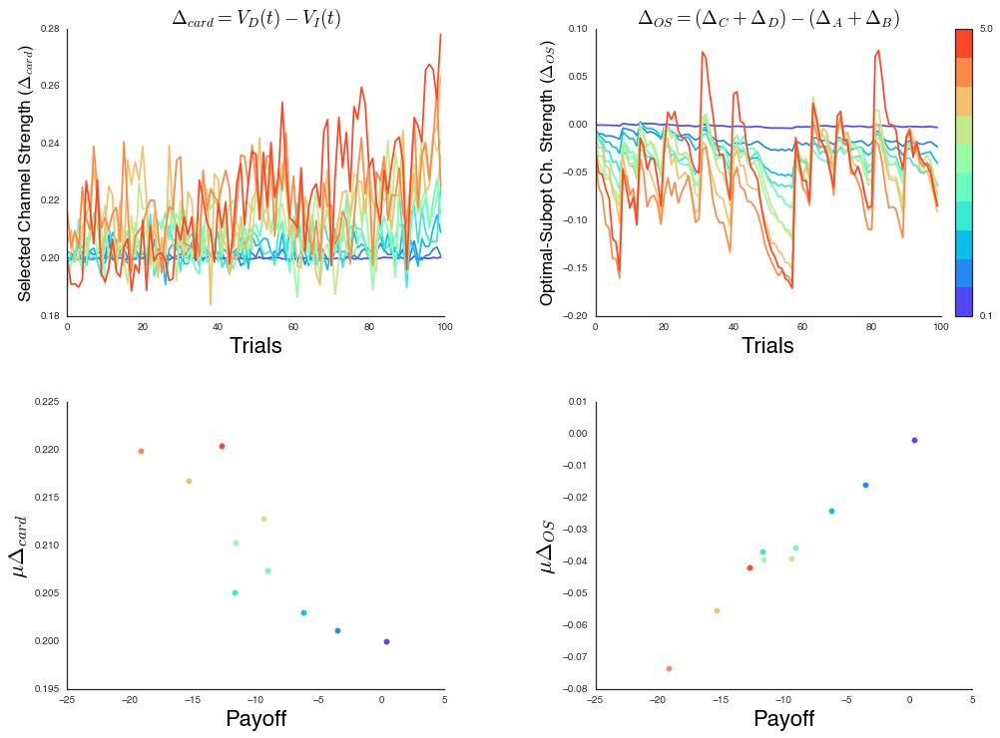

In [41]:
multirace.plot_reactivity_payoff(trialsdf[trialsdf.agroup==2], igtdf[igtdf.agroup==2])

In [84]:
x = df.Beta.unique()
plt.errorbar(x=x, y=Pmu, yerr=Pse, label='P +/- 95CI')
plt.errorbar(x=x, y=Qmu, yerr=Qse, label='Q +/- 95CI')
ax = plt.gca()
ax.legend(loc=0)
sns.despine()

ax.set_xlabel('Exploitation Parameter (Softmax InvTemp)')
ax.set_ylabel('P,Q Score')
#plt.savefig('/home/kyle/Dropbox/PQ_PolicyEffect_95CI.png', dpi=300)

In [333]:
from random import random
from itertools import takewhile

def accumulate(iterator):
    """Returns a cumulative sum of the elements.
    accumulate([1, 2, 3, 4, 5]) --> 1 3 6 10 15"""
    current = 0
    for value in iterator:
        current += value
        yield current

def weightedChoice(weights, objects):
    """Return a random item from objects, with the weighting defined by weights 
    (which must sum to 1)."""
    limit = random()
    return objects[sum(takewhile(bool, (value < limit for value in accumulate(weights))))]